In [35]:
import fitz

text = ""

with fitz.open('pdf1.pdf') as doc:
    for page in doc:
        text += page.get_text()

print(text)


Chapter 2 – Software Processes
Chapter 2 Software Processes
1
Updated 06/06/2021
Topics Covered
 Software Process Models
 Process Activities
 Process Improvement
Chapter 2 Software Processes
2
Updated 06/06/2021
The software process
 A structured set of activities required to develop a 
software system. 
 Many different software processes but all involve:
▪ Specification – defining what the system should do;
▪ Design and implementation – defining the organization of the 
system and implementing the system;
▪ Validation – checking that it does what the customer wants;
▪ Evolution – changing the system in response to changing 
customer needs.
 A software process model is an abstract representation 
of a process. It presents a description of a process from 
some particular perspective.
Chapter 2 Software Processes
3
Updated 06/06/2021
Software Process Descriptions
 When we describe and discuss processes, we usually 
talk about the activities in these processes such as 
specifying a

In [22]:
# Install Poppler
!apt-get install poppler-utils

# Install Tesseract
!apt-get install tesseract-ocr

# Install Python packages
!pip install pdf2image pytesseract




Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
poppler-utils is already the newest version (22.02.0-2ubuntu0.2).
0 upgraded, 0 newly installed, 0 to remove and 18 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 18 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.

In [16]:
!pip install pdf2image


In [13]:
!pip install pytesseract pillow


In [2]:
!pip install PyMuPDF

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 32.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.6/30.6 MB 44.3 MB/s eta 0:00:00


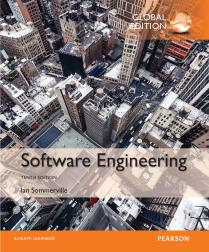

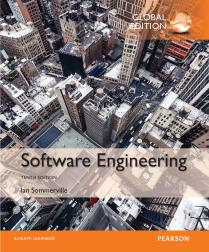

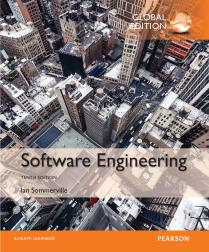

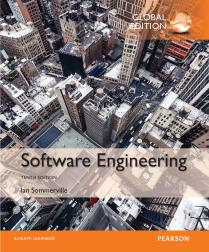

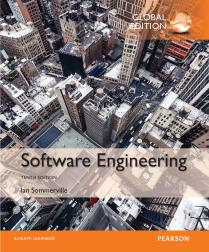

...

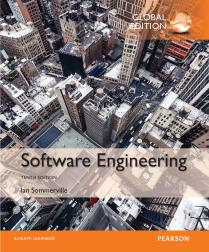

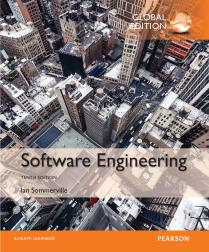

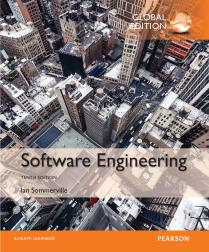

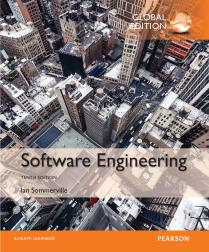

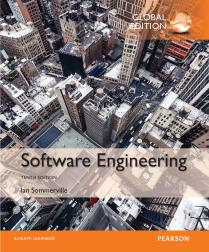

In [30]:
import fitz
from PIL import Image
import io
from IPython.display import display
def display_images_from_pdf(pdf_path):
    pdf_document = fitz.open(pdf_path)

    for page_number in range(pdf_document.page_count):
        page = pdf_document.load_page(page_number)

        image_list = page.get_images(full=True)
        for img_index, img in enumerate(image_list):
            xref = img[0]
            base_image = pdf_document.extract_image(xref)
            image_data = base_image["image"]
            image = Image.open(io.BytesIO(image_data))
            display(image)

    pdf_document.close()

pdf_path = 'pdf1.pdf'
display_images_from_pdf(pdf_path)


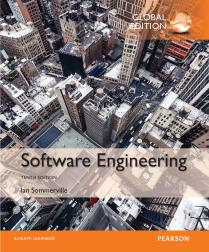

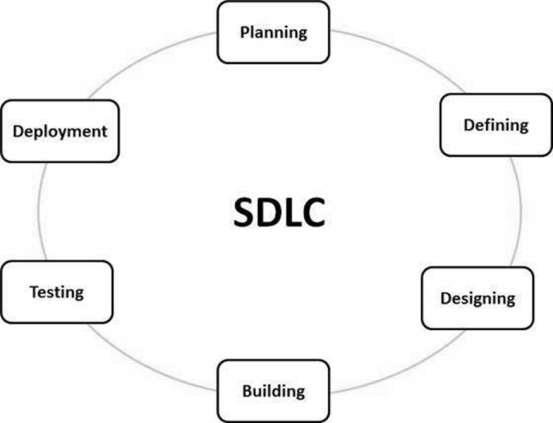

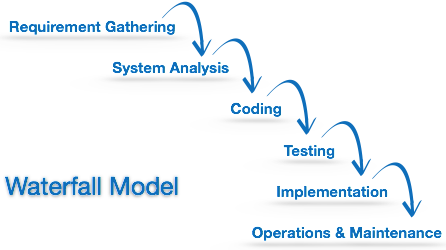

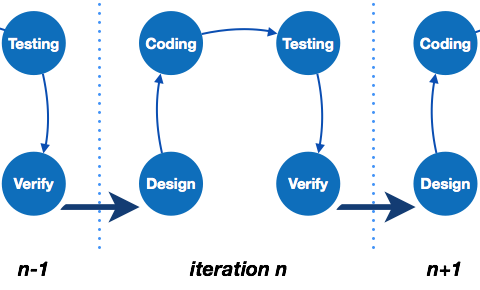

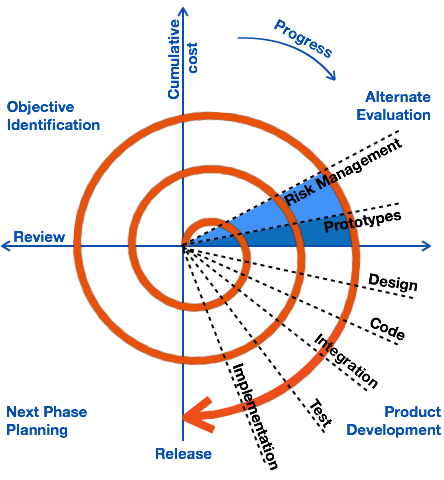

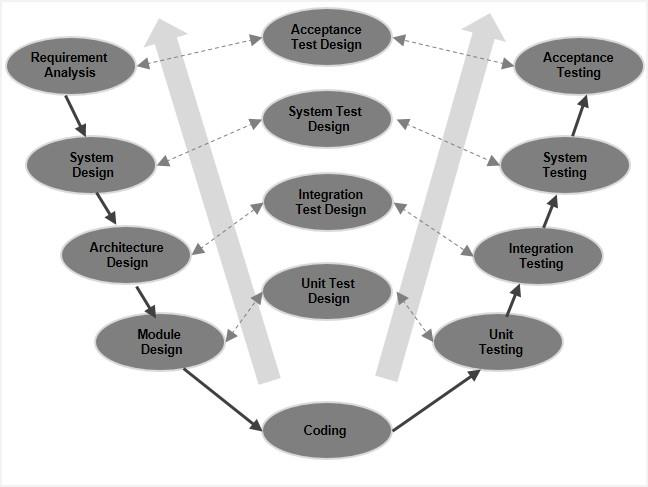

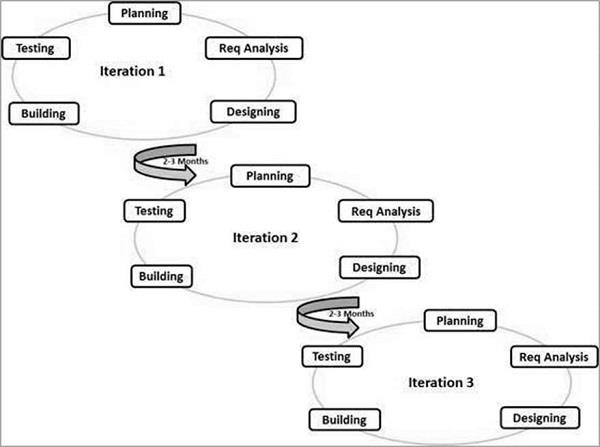

In [40]:
import fitz  # PyMuPDF
from PIL import Image
import io
import imagehash
from IPython.display import display
import os
import pytesseract
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

def display_non_duplicate_images_from_pdf(pdf_path):
    pdf_document = fitz.open(pdf_path)
    image_hashes = {}

    for page_number in range(pdf_document.page_count):
        page = pdf_document.load_page(page_number)

        image_list = page.get_images(full=True)
        for img_index, img in enumerate(image_list):
            xref = img[0]
            base_image = pdf_document.extract_image(xref)
            image_data = base_image["image"]
            image = Image.open(io.BytesIO(image_data))
            image_hash = imagehash.phash(image)
            if image_hash in image_hashes:
                continue
            else:
                image_hashes[image_hash] = None
                display(image)

    pdf_document.close()
pdf_path = 'pdf1.pdf'
display_non_duplicate_images_from_pdf(pdf_path)


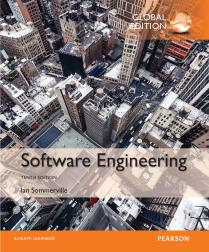

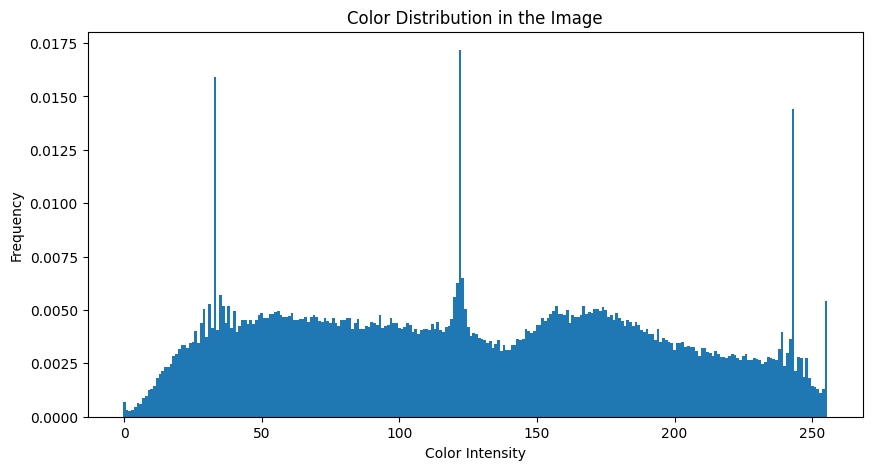

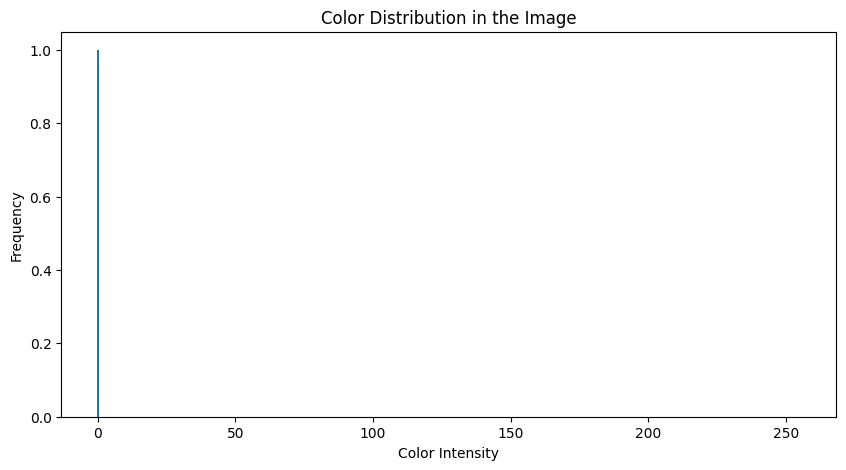

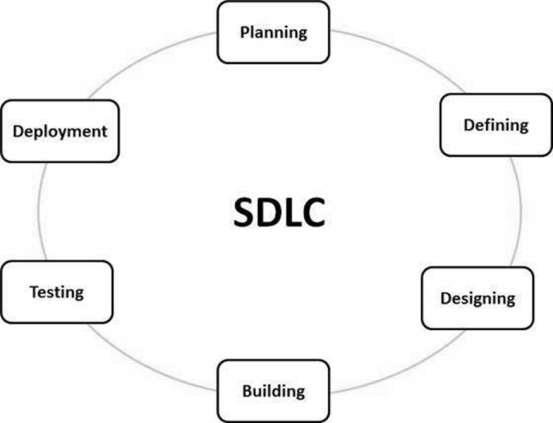

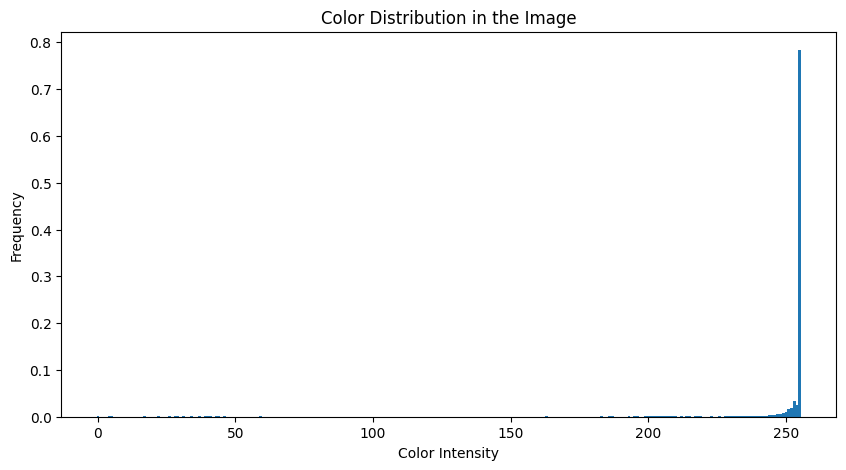

...

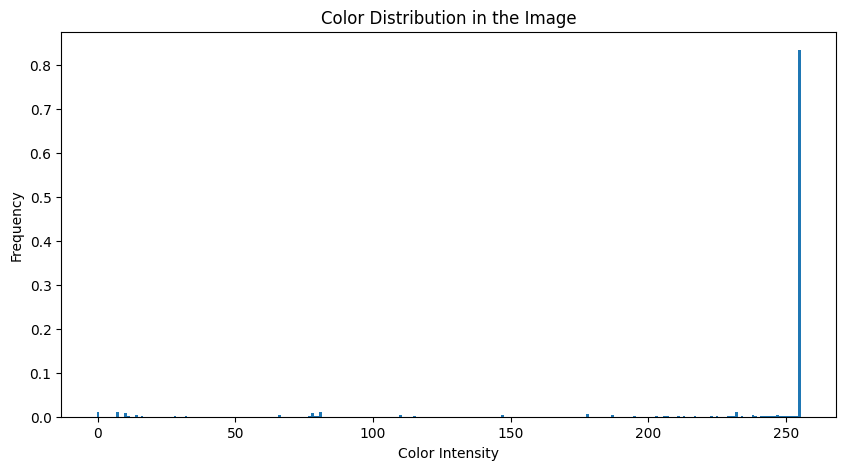

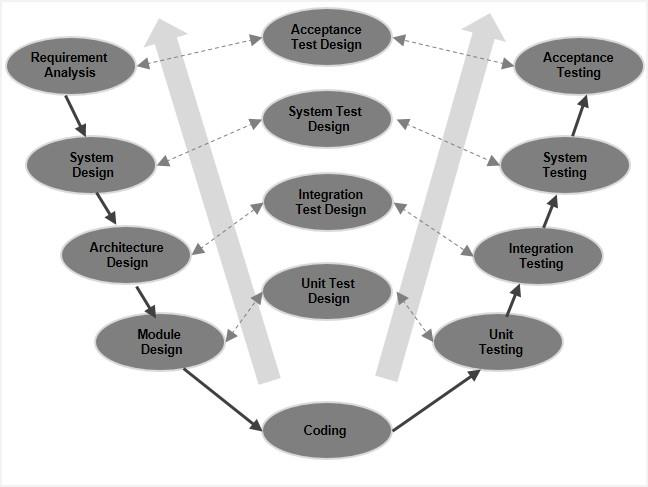

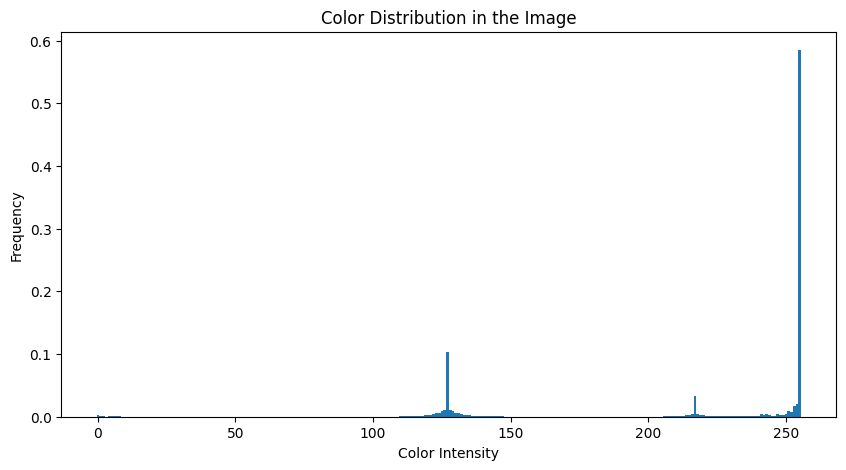

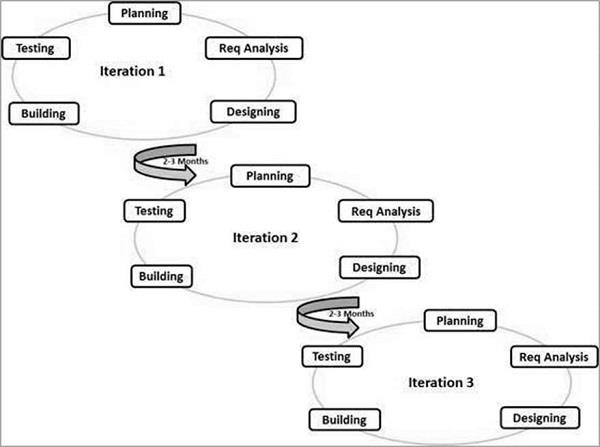

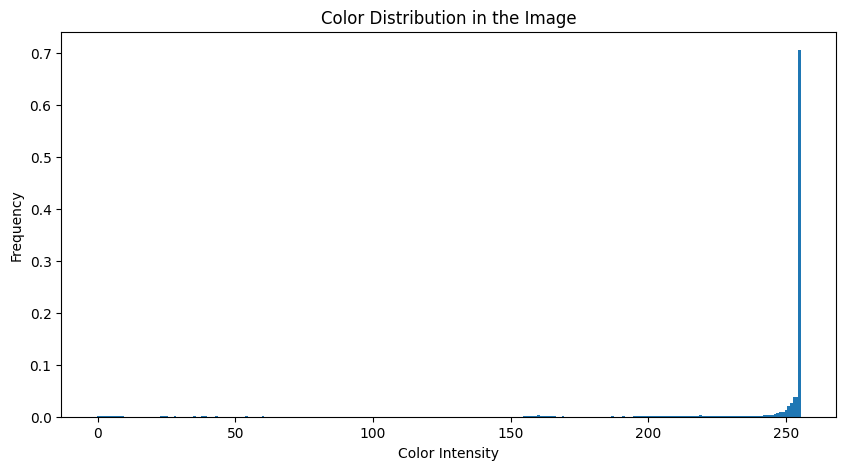

In [42]:
import fitz
from PIL import Image
import io
import imagehash
from IPython.display import display
import os
import pytesseract
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

def display_non_duplicate_images_from_pdf(pdf_path):
    pdf_document = fitz.open(pdf_path)
    image_hashes = {}

    for page_number in range(pdf_document.page_count):
        page = pdf_document.load_page(page_number)

        image_list = page.get_images(full=True)
        for img_index, img in enumerate(image_list):
            xref = img[0]
            base_image = pdf_document.extract_image(xref)
            image_data = base_image["image"]
            image = Image.open(io.BytesIO(image_data))
            image_hash = imagehash.phash(image)
            if image_hash in image_hashes:
                continue
            else:
                image_hashes[image_hash] = None
                display(image)
                image_np = np.array(image)
                image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
                hist, bins = np.histogram(image_bgr, bins=256, range=(0, 256))
                hist = hist / hist.sum()
                plt.figure(figsize=(10, 5))
                plt.bar(range(256), hist, width=1)
                plt.title('Color Distribution in the Image')
                plt.xlabel('Color Intensity')
                plt.ylabel('Frequency')
                plt.show()

    pdf_document.close()9
pdf_path = 'pdf1.pdf'
display_non_duplicate_images_from_pdf(pdf_path)


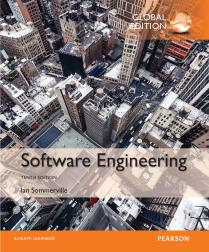

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Top 3 Colors in the Image:
1. darkslategray: 0.34546593757120075
2. indianred: 0.33528898002582214
3. silver: 0.31924508240297716


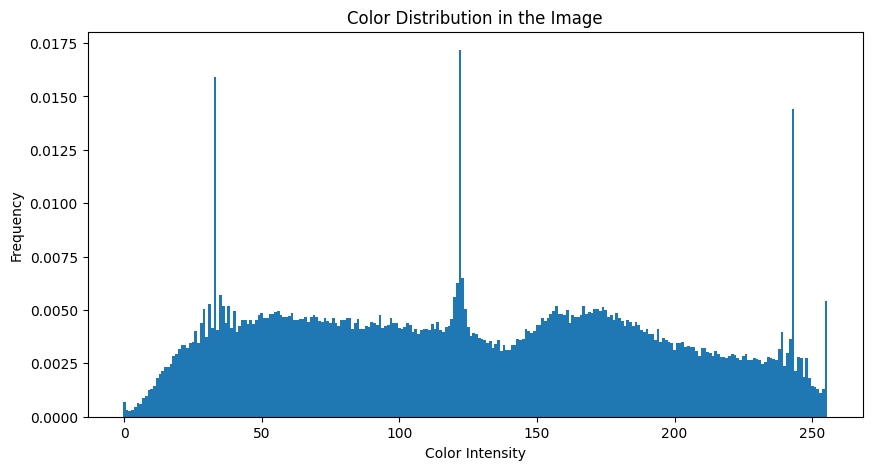

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-57-a7da45110c6f>:24: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  kmeans.fit(pixels)


Top 3 Colors in the Image:
1. black: 1.0


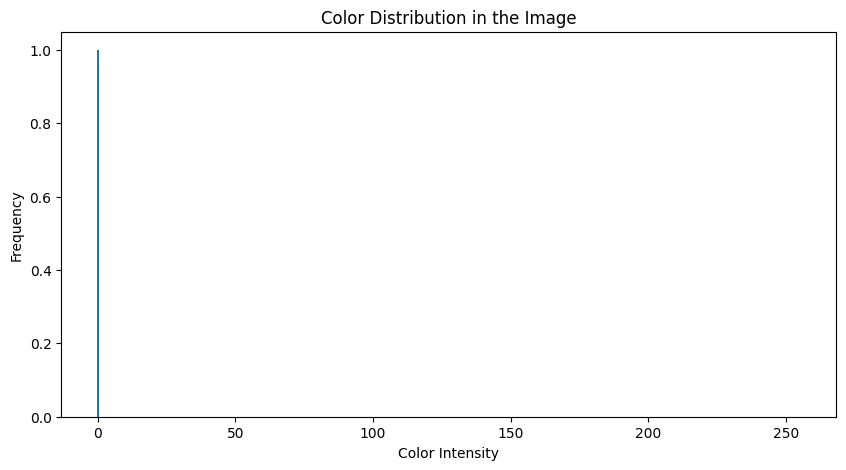

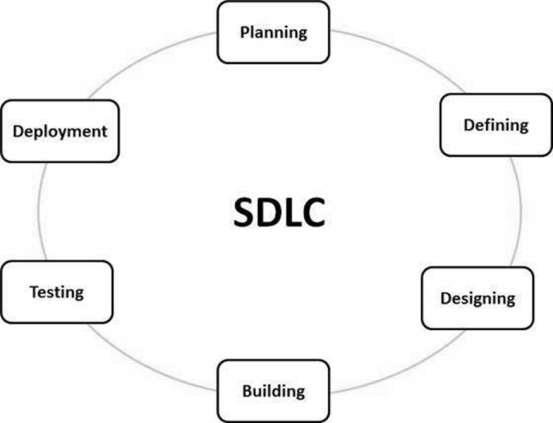

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Top 3 Colors in the Image:
1. white: 0.9391840765393149
2. darkslategray: 0.03107485924614931
3. silver: 0.0297410642145358


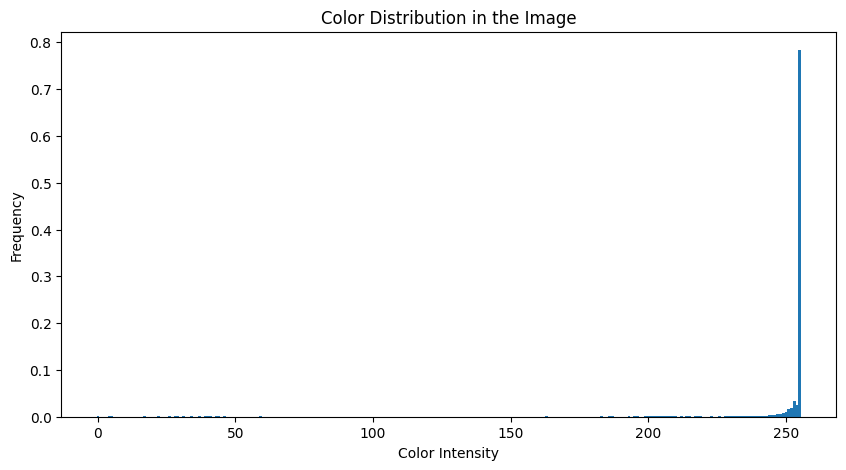

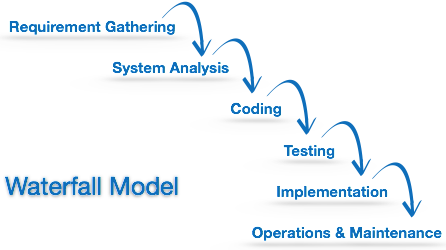

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Top 3 Colors in the Image:
1. white: 0.9291569506726457
2. lightsteelblue: 0.05012556053811659
3. steelblue: 0.020717488789237667


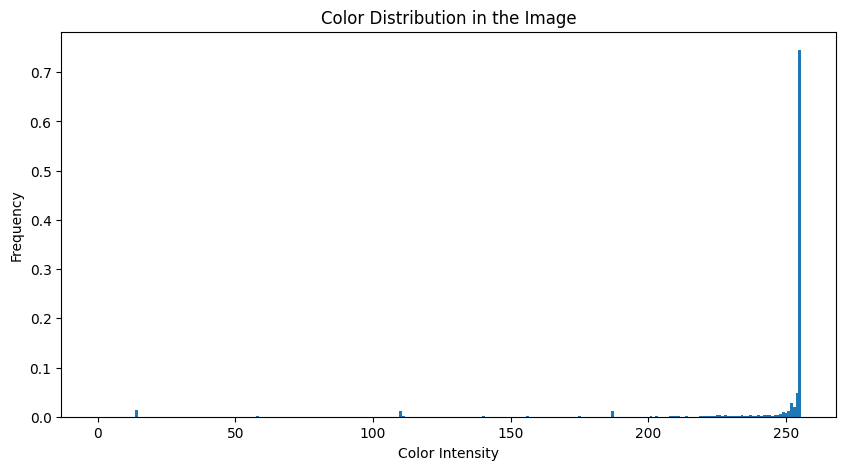

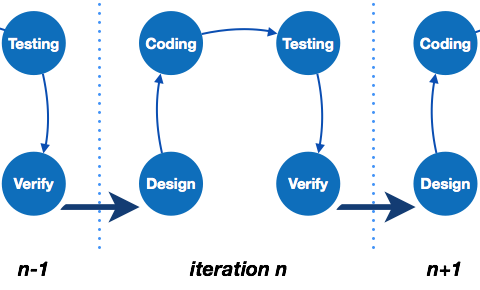

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Top 3 Colors in the Image:
1. white: 0.8065517241379311
2. steelblue: 0.1869971264367816
3. black: 0.006451149425287356


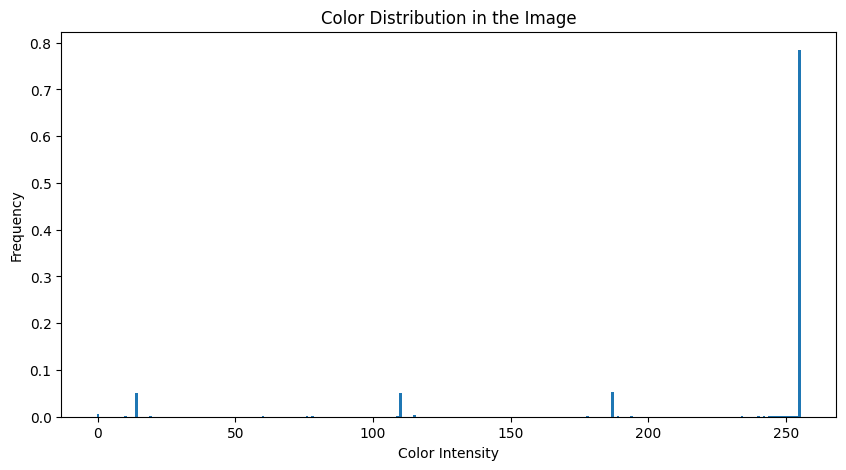

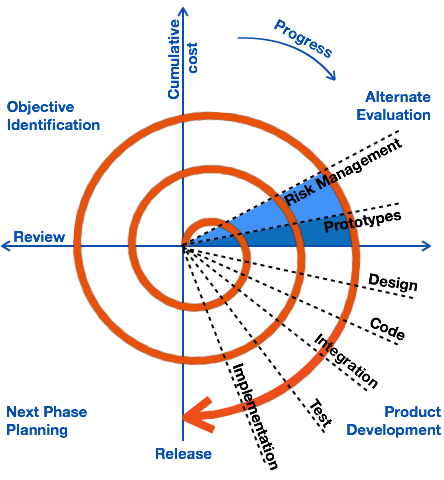

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Top 3 Colors in the Image:
1. white: 0.8665587462462463
2. darkslateblue: 0.07468562312312313
3. chocolate: 0.05875563063063063


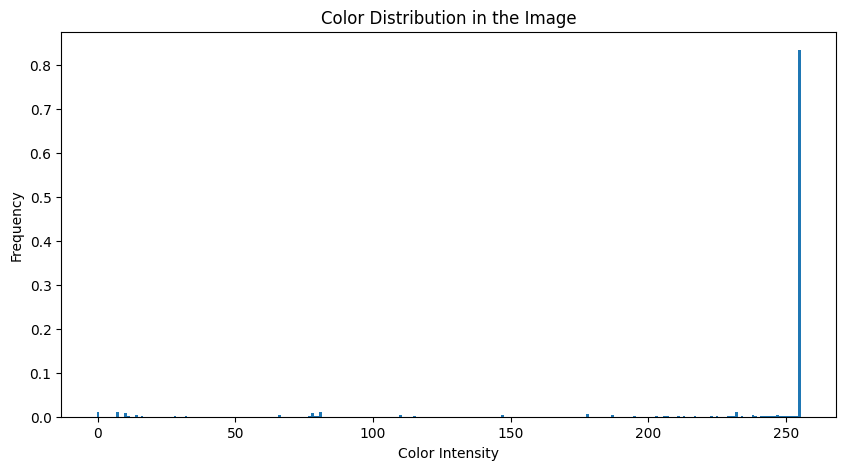

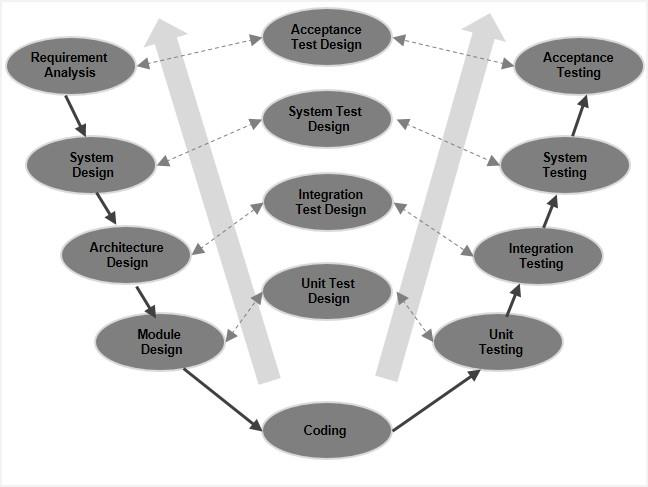

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Top 3 Colors in the Image:
1. snow: 0.7561696706973914
2. gray: 0.2223077800593201
3. black: 0.021522549243288464


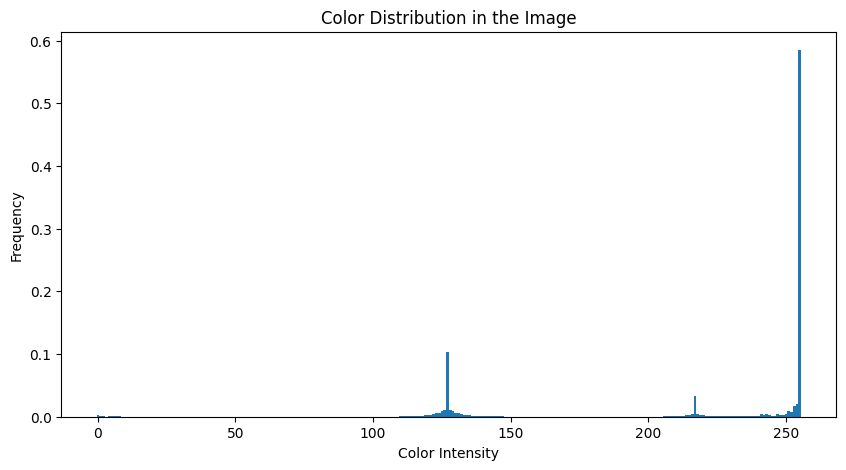

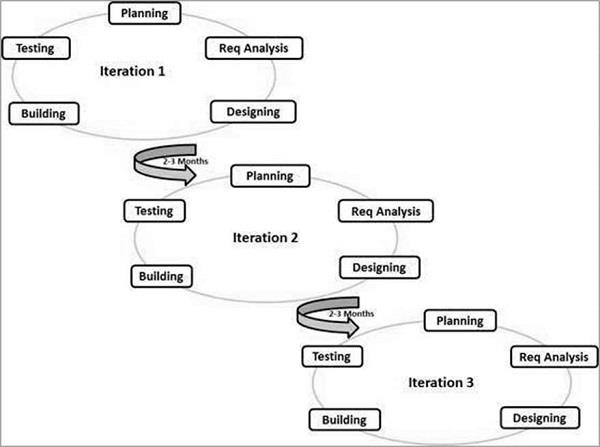

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Top 3 Colors in the Image:
1. darkslategray: 0.9180909768829232
2. white: 0.04618568232662192
3. darkgray: 0.03572334079045488


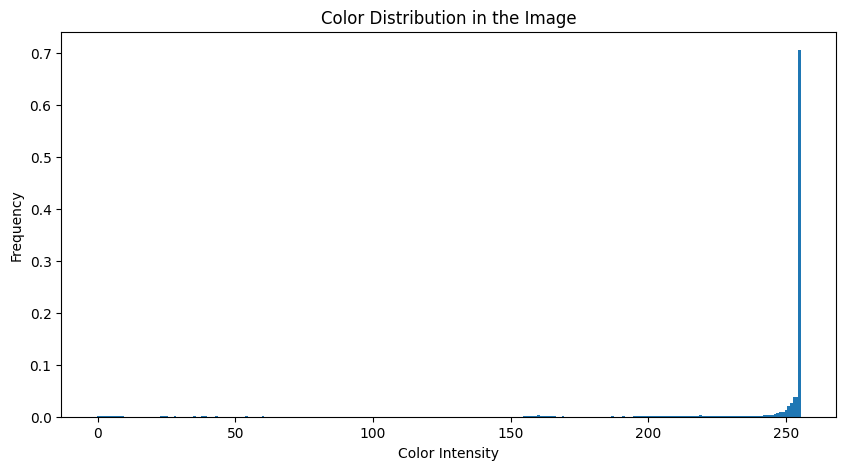

In [57]:
import fitz
from PIL import Image
import io
import imagehash
from IPython.display import display
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import webcolors

def get_top_colors(image, num_colors=3):
    image_np = np.array(image)
    image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    pixels = image_bgr.reshape((-1, 3))
    kmeans = KMeans(n_clusters=num_colors)
    kmeans.fit(pixels)
    dominant_colors = kmeans.cluster_centers_
    dominant_colors = [tuple(int(round(bgr)) for bgr in color)[::-1] for color in dominant_colors]
    total_pixels = len(pixels)
    color_counts = Counter(kmeans.labels_)
    color_percentages = [count / total_pixels for count in color_counts.values()]
    top_colors = list(zip(dominant_colors, color_percentages))
    top_colors.sort(key=lambda x: x[1], reverse=True)

    return top_colors

def closest_color(requested_color):
    min_colors = {}
    for key, name in webcolors.CSS3_HEX_TO_NAMES.items():
        r_c, g_c, b_c = webcolors.hex_to_rgb(key)
        rd = (r_c - requested_color[0]) ** 2
        gd = (g_c - requested_color[1]) ** 2
        bd = (b_c - requested_color[2]) ** 2
        min_colors[(rd + gd + bd)] = name
    return min_colors[min(min_colors.keys())]

def display_non_duplicate_images_from_pdf(pdf_path):
    pdf_document = fitz.open(pdf_path)
    image_hashes = {}
    for page_number in range(pdf_document.page_count):
        page = pdf_document.load_page(page_number)

        image_list = page.get_images(full=True)
        for img_index, img in enumerate(image_list):
            xref = img[0]
            base_image = pdf_document.extract_image(xref)
            image_data = base_image["image"]
            image = Image.open(io.BytesIO(image_data))
            image_hash = imagehash.phash(image)
            if image_hash in image_hashes:
                continue
            else:
                image_hashes[image_hash] = None
                display(image)
                top_colors = get_top_colors(image, num_colors=3)

                print(f"Top 3 Colors in the Image:")
                for i, (color, count) in enumerate(top_colors):
                    color_name = closest_color(color)
                    print(f"{i + 1}. {color_name}: {count}")
                image_bgr = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
                hist, bins = np.histogram(image_bgr, bins=256, range=(0, 256))
                hist = hist / hist.sum()
                plt.figure(figsize=(10, 5))
                plt.bar(range(256), hist, width=1)
                plt.title('Color Distribution in the Image')
                plt.xlabel('Color Intensity')
                plt.ylabel('Frequency')
                plt.show()

    pdf_document.close()
pdf_path = 'pdf1.pdf'
display_non_duplicate_images_from_pdf(pdf_path)


In [33]:
!pip install imagehash

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 3.7 MB/s eta 0:00:00


Font Size: 36, Percentage: 0.24%
Font Size: 12, Percentage: 13.88%
Font Size: 24, Percentage: 48.79%
Font Size: 20, Percentage: 35.99%
Font Size: 18, Percentage: 0.76%
Font Size: 40, Percentage: 0.08%
Font Size: 54, Percentage: 0.05%
Font Size: 44, Percentage: 0.21%


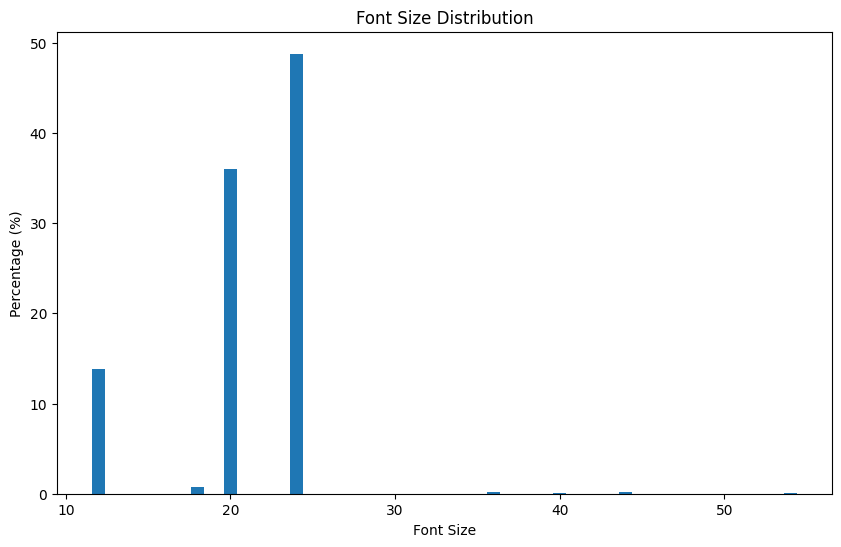

In [9]:
import pdfplumber
from collections import Counter
import matplotlib.pyplot as plt

def get_cumulative_font_sizes(pdf_path, decimal_places=2):
    font_sizes = []

    with pdfplumber.open(pdf_path) as pdf:
        total_chars = 0

        for page in pdf.pages:
            for char in page.chars:
                font_size = round(char['size'])
                font_sizes.append(font_size)
                total_chars += 1

    font_size_counts = Counter(font_sizes)
    font_size_percentages = {size: count / total_chars * 100 for size, count in font_size_counts.items()}
    for font_size, percentage in font_size_percentages.items():
      print(f"Font Size: {font_size}, Percentage: {percentage:.2f}%")

    return font_size_percentages

pdf_path = 'pdf1.pdf'
decimal_places = 2
font_size_percentages = get_cumulative_font_sizes(pdf_path, decimal_places)
font_sizes, percentages = zip(*font_size_percentages.items())
plt.figure(figsize=(10, 6))
plt.bar(font_sizes, percentages)
plt.xlabel('Font Size')
plt.ylabel('Percentage (%)')
plt.title('Font Size Distribution')
plt.show()



In [12]:
!pip install pdfplumber

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.5/47.5 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 44.3 MB/s eta 0:00:00


In [45]:
import fitz  # PyMuPDF

def extract_footer(pdf_file_path, min_font_size=10, max_font_size=14):
    footers = []

    pdf_document = fitz.open(pdf_file_path)

    for page_num in range(len(pdf_document)):
        page = pdf_document.load_page(page_num)

        # Extract text on the page
        page_text = page.get_text("dict")

        for block in page_text.get("blocks", []):
            for line in block.get("lines", []):
                for span in line.get("spans", []):
                    text = span["text"]
                    font_size = span["size"]
                    y0 = span["bbox"][1]
                    if y0 >= (page.rect.height - 100):
                        footers.append(text.strip())

    pdf_document.close()
    return footers
input_pdf_file = "pdf1.pdf"



extracted_footers = extract_footer(input_pdf_file)

for footer in extracted_footers:
    print(footer)










Chapter 2 Software Processes
1
Updated 06/06/2021
Chapter 2 Software Processes
2
Updated 06/06/2021
some particular perspective.
Chapter 2 Software Processes
3
Updated 06/06/2021
Chapter 2 Software Processes
4
Updated 06/06/2021
Updated 06/06/2021
Chapter 2 Software Processes
5
Graphical representation of the various stages of a typical SDLC
Chapter 2 Software Processes
6
Updated 06/06/2021
Chapter 2 Software Processes
7
Updated 06/06/2021
Updated 06/06/2021
Chapter 2 Software Processes
8
Chapter 2 Software Processes
9
Updated 06/06/2021
process begins only if the previous phase is complete.
Updated 06/06/2021
Chapter 2 Software Processes
10
Chapter 2 Software Processes
11
Updated 06/06/2021
process that incorporates elements from all of these
models.
Chapter 2 Software Processes
12
Updated 06/06/2021
Updated 06/06/2021
Chapter 2 Software Processes
13
Updated 06/06/2021
Chapter 2 Software Processes
14
• Process and results are well documented.
Updated 06/06/2021
Chapter 2 Software Proc

In [46]:
import fitz

def extract_page_numbers(pdf_file_path):
    page_numbers = []

    pdf_document = fitz.open(pdf_file_path)

    for page_num in range(len(pdf_document)):
        page = pdf_document.load_page(page_num)

        page_text = page.get_text("dict")

        for block in page_text.get("blocks", []):
            for line in block.get("lines", []):
                for span in line.get("spans", []):
                    text = span["text"]
                    y0 = span["bbox"][1]
                    if y0 >= (page.rect.height - 100):
                        if text.isdigit() and 1 <= int(text) <= len(pdf_document):
                            page_numbers.append(text)

    pdf_document.close()
    return page_numbers

input_pdf_file = "pdf1.pdf"

extracted_page_numbers = extract_page_numbers(input_pdf_file)

for page_number in extracted_page_numbers:
    print(f"Page Number: {page_number}")


Page Number: 1
Page Number: 2
Page Number: 3
Page Number: 4
Page Number: 5
Page Number: 6
Page Number: 7
Page Number: 8
Page Number: 9
Page Number: 10
Page Number: 11
Page Number: 12
Page Number: 13
Page Number: 14
Page Number: 15
Page Number: 16
Page Number: 17
Page Number: 18
Page Number: 19
Page Number: 20
Page Number: 21
Page Number: 22
Page Number: 23
Page Number: 24
Page Number: 25
Page Number: 26
Page Number: 27
Page Number: 28
Page Number: 29
Page Number: 30
Page Number: 31
Page Number: 32
Page Number: 33
Page Number: 34
Page Number: 35
Page Number: 36
Page Number: 37
Page Number: 38
Page Number: 39
Page Number: 40
Page Number: 41
Page Number: 42
Page Number: 43
Page Number: 44
Page Number: 45
Page Number: 46
Page Number: 47
Page Number: 48
Page Number: 49
Page Number: 50
Page Number: 51
Page Number: 52
Page Number: 53
Page Number: 54
Page Number: 55
Page Number: 56
Page Number: 57
Page Number: 58
Page Number: 59
Page Number: 60
Page Number: 61
Page Number: 62
Page Number: 63
P

In [94]:
import fitz

def extract_links(pdf_file_path):
    links = []
    unique_urls = set()
    pdf_document = fitz.open(pdf_file_path)

    for page_num in range(len(pdf_document)):
        page = pdf_document.load_page(page_num)
        page_links = page.get_links()
        page_text = page.get_text("dict")

        for link in page_links:
            link_url = link.get("uri")
            text_value = None

            for block in page_text.get('blocks', []):
                for line in block.get('lines', []):
                    for span in line.get('spans', []):
                        if 'text' in span:
                            text_value = span['text']
                            break
            if link_url not in unique_urls:
                links.append({
                    "text": text_value,
                    "url": link_url,
                    "page": page_num + 1
                })
                unique_urls.add(link_url)

    pdf_document.close()
    return links

input_pdf_file = "malla_vasudha_resume.pdf"

extracted_links = extract_links(input_pdf_file)

for link_info in extracted_links:
    print(f"URL: {link_info['url']}")
    print(f"Page: {link_info['page']}")
    print()


URL: https://www.linkedin.com/in/vasudhamalla/
Page: 1

URL: mailto:vasudha.malla@gmail.com%7C
Page: 1

URL: https://github.com/vasudhamalla
Page: 1



In [104]:
import pdfplumber
from urllib.parse import urlparse
def is_valid_url(string):
    parsed_url = urlparse(string)
    return all([parsed_url.scheme, parsed_url.netloc])

def extract_links(pdf_file_path):
    links = []

    with pdfplumber.open(pdf_file_path) as pdf:
        for page_num, page in enumerate(pdf.pages):
            text = page.extract_text()

            words = text.split()
            url_parts = []
            in_url = False

            for word in words:
                if is_valid_url(word):
                    if in_url:
                        url_parts.append(word)
                    else:
                        in_url = True
                        url_parts = [word]
                else:
                    if in_url:
                        in_url = False
                        url = " ".join(url_parts)
                        links.append({
                            "url": url,
                            "page": page_num + 1
                        })
            if in_url:
                url = " ".join(url_parts)
                links.append({
                    "url": url,
                    "page": page_num + 1
                })

    return links

input_pdf_file = "e.pdf"

extracted_links = extract_links(input_pdf_file)

for link_info in extracted_links:
    print(f"URL: {link_info['url']}")
    print(f"Page: {link_info['page']}")
    print()




URL: https://unt.instructure.com/login/ldap https://joinhandshake.com/
Page: 1

